In [2]:
import os
import sys
#sys.path.append('/home/cjw/Code/DeepLearning')

import tensorflow as tf
import numpy as np
import pandas as pd

from autoencoder import autoencoder_train
from autoencoder import network
from autoencoder import utils

In [3]:
#datadir = "/v/Data/cyto/ChannelOne/"
datadir = "/media/cjw/Data/cyto/mmFromTifs3"

mmfiles = utils.list_mmfiles(datadir)
print(mmfiles)

mmdict = dict()

n_all_images = 0
for mmfilename in mmfiles:
#mmfilename = datadir + "Fish6_15_cjw_mean_zero.mm"
#mmfilename = datadir + "mmplate15-1.mm"
    mmheader = np.memmap(mmfilename, dtype="int32", mode='r',
                    shape=(4,))

    header_shape = mmheader.shape
    print(header_shape, mmheader)
    xshape = [mmheader[0], mmheader[1], mmheader[2], mmheader[3]]
    xshape = tuple(xshape)
    del mmheader
    n_all_images += xshape[0]
    
    m3 = np.memmap(mmfilename, dtype='float32', offset=128,
              mode='r', shape=xshape)
    key = mmfilename.split("/")[-1]
    mmdict[key] = m3

print(n_all_images)
mmdict.keys()

['/media/cjw/Data/cyto/mmFromTifs3/Fish6_Untreated.mm', '/media/cjw/Data/cyto/mmFromTifs3/Fish6_ICE.mm', '/media/cjw/Data/cyto/mmFromTifs3/Fish6_CCB.mm']
(4,) [10000    64    64     5]
(4,) [10000    64    64     5]
(4,) [10000    64    64     5]
30000


dict_keys(['Fish6_Untreated.mm', 'Fish6_ICE.mm', 'Fish6_CCB.mm'])

In [4]:
n = xshape[0]
all_ids =  range(n_all_images)
idx = 0
dataframes = list()
for key in mmdict.keys():
    mm = mmdict[key]
    n = mm.shape[0]
    print(n)
    file = n*[key[0:-3]]
    fid = range(n)
    mmfile = n*[key]
    plate = n*[0]
    row = n*[0]
    column = n*[0]
    field = n*[0]
    yc = n*[32]
    xc = n*[32]
    well = n*[0]
    ids = all_ids[idx:idx + n]
    idx += n
    df = pd.DataFrame({'id':ids, 'fid':fid, 'file':file, 'mmfile':mmfile, 'plate':plate,
                     'row':row, 'column':column, 'field':field,
                      'yc':yc, 'xc':xc, 'well':well})

    dataframes.append(df)
    
p_df = pd.concat(dataframes, ignore_index=True)

10000
10000
10000


Encoder True
[<tf.Tensor 'Placeholder:0' shape=(?, 32, 32, 4) dtype=float32>, <tf.Tensor 'dropout/mul:0' shape=(?, 16, 16, 128) dtype=float32>, <tf.Tensor 'dropout_1/mul:0' shape=(?, 8, 8, 256) dtype=float32>, <tf.Tensor 'dropout_2/mul:0' shape=(?, 4, 4, 512) dtype=float32>] Tensor("latent_space/BiasAdd:0", shape=(?, 224), dtype=float32)
isize:  4 32
dh0 (?, 32, 32, 4)
[<tf.Tensor 'dropout_3/mul:0' shape=(?, 8192) dtype=float32>, <tf.Tensor 'Reshape:0' shape=(?, 4, 4, 512) dtype=float32>, <tf.Tensor 'dropout_4/mul:0' shape=(?, 8, 8, 256) dtype=float32>, <tf.Tensor 'dropout_5/mul:0' shape=(?, 16, 16, 128) dtype=float32>] Tensor("Minimum:0", shape=(?, 32, 32, 4), dtype=float32)
Tensor("Mean_1:0", shape=(), dtype=float32) Tensor("Mean_2:0", shape=(), dtype=float32) Tensor("add_5:0", shape=(), dtype=float32)
30000 234 128
Epoch:  0 Iteration:  0 Loss:  621.74 2.90826 0.300049


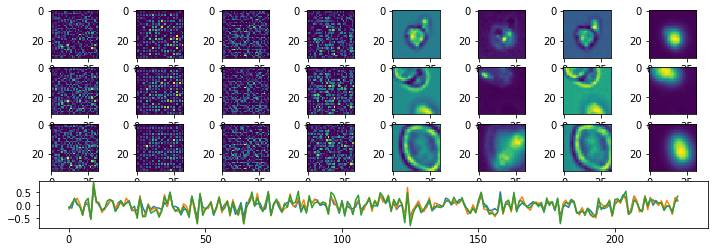

Epoch:  1 Iteration:  0 Loss:  18.1063 0.63772 0.000445396


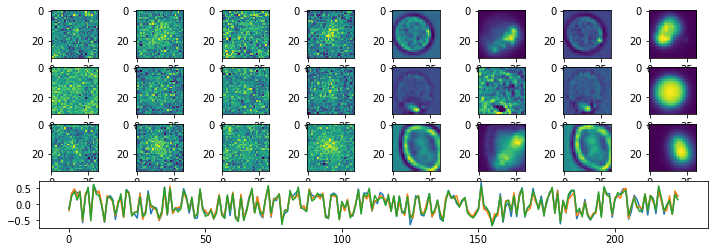

Epoch:  2 Iteration:  0 Loss:  18.6116 0.638009 0.0031473


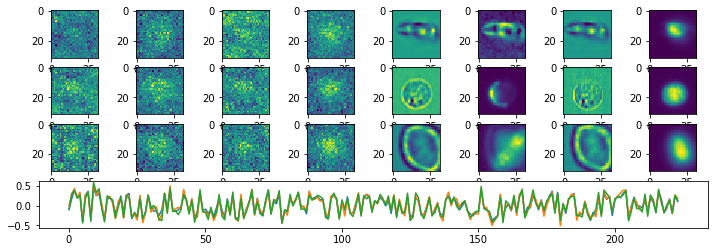

Epoch:  3 Iteration:  0 Loss:  13.6371 0.635282 0.00130579


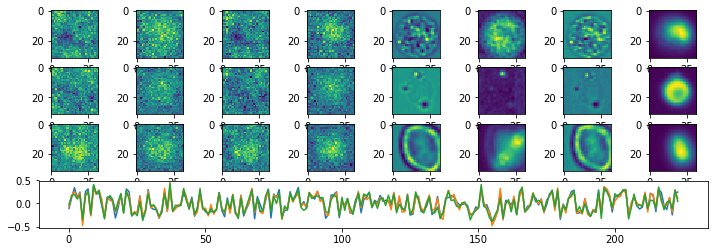

Epoch:  4 Iteration:  0 Loss:  12.2212 0.634555 0.00148681


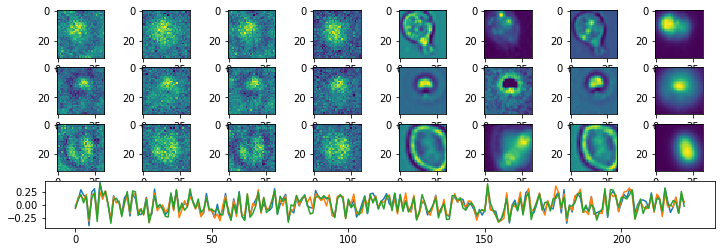

Epoch:  5 Iteration:  0 Loss:  11.1608 0.634015 0.0011757


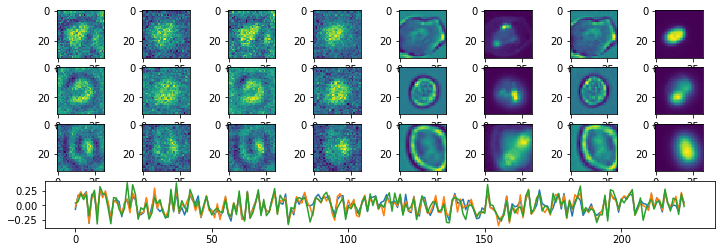

Epoch:  6 Iteration:  0 Loss:  10.1372 0.633484 0.00115538


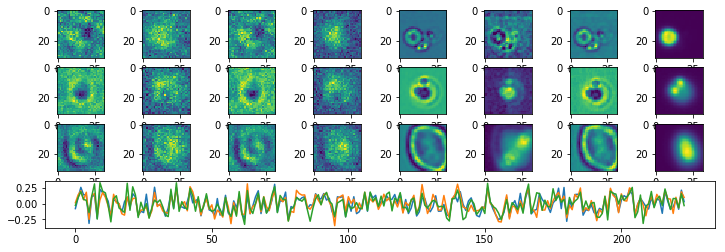

Epoch:  7 Iteration:  0 Loss:  8.96878 0.63287 0.00158566


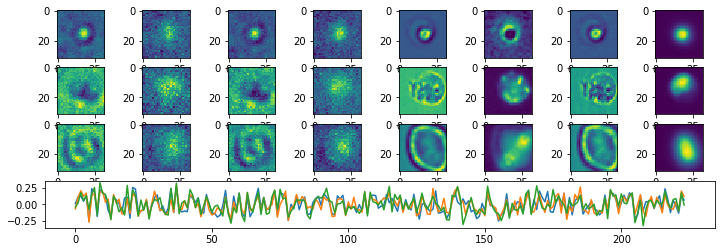

Epoch:  8 Iteration:  0 Loss:  8.38708 0.632561 0.000733316


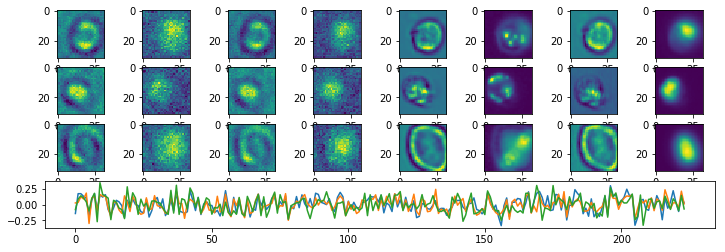

Epoch:  9 Iteration:  0 Loss:  7.78718 0.632252 0.00147042


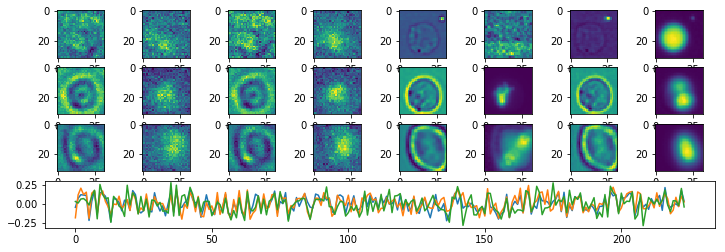

Epoch:  10 Iteration:  0 Loss:  7.29084 0.63199 0.000960618


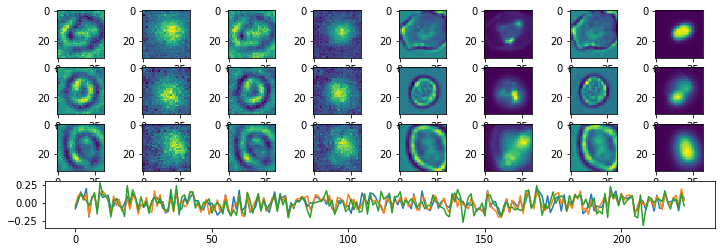

Epoch:  11 Iteration:  0 Loss:  7.16295 0.631921 0.00194892


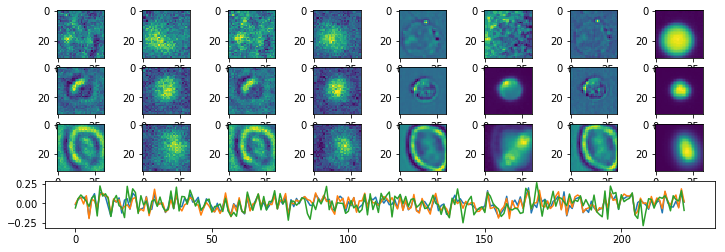

Epoch:  12 Iteration:  0 Loss:  6.85873 0.631763 0.00190994


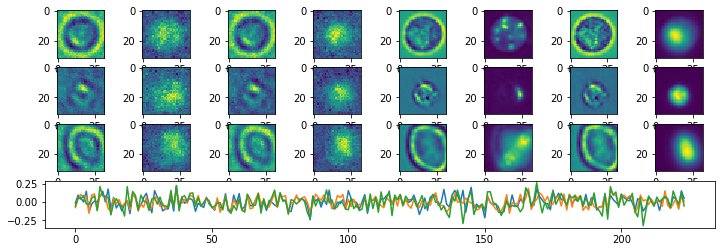

Epoch:  13 Iteration:  0 Loss:  6.46637 0.631558 0.00143895


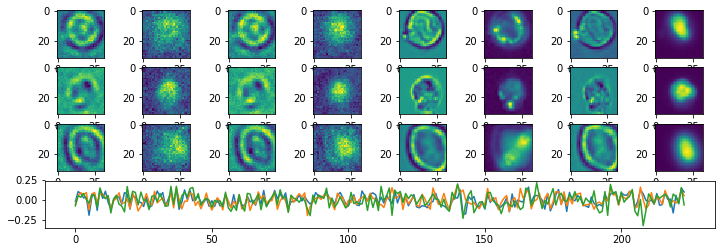

Epoch:  14 Iteration:  0 Loss:  6.18357 0.63141 0.000798643


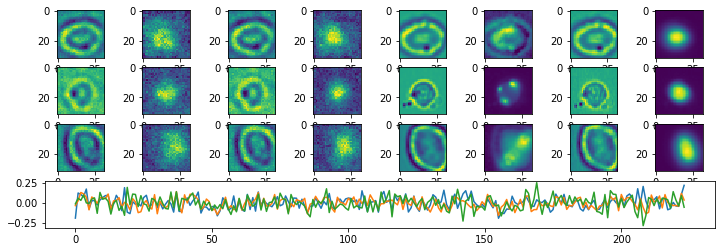

Epoch:  15 Iteration:  0 Loss:  6.20087 0.631421 0.00158775


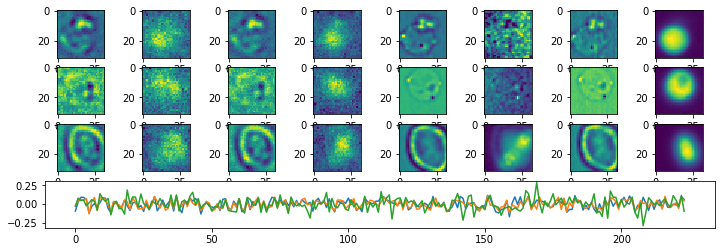

Epoch:  16 Iteration:  0 Loss:  5.81653 0.631219 0.00121444


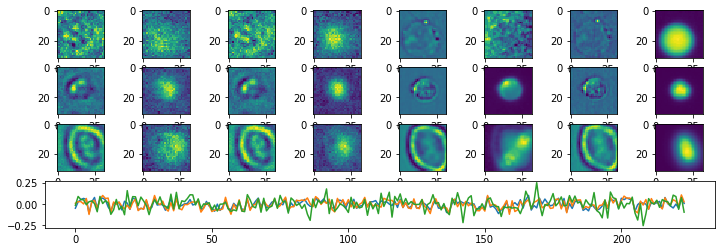

Epoch:  17 Iteration:  0 Loss:  5.61204 0.631111 0.000783175


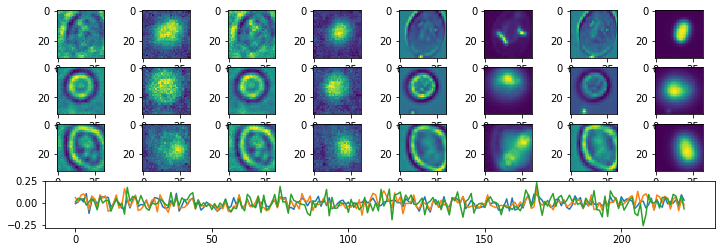

Epoch:  18 Iteration:  0 Loss:  5.49241 0.631048 0.000926197


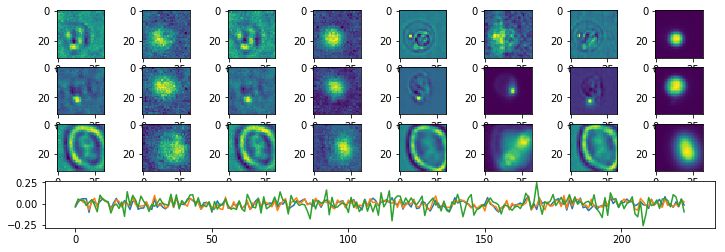

Epoch:  19 Iteration:  0 Loss:  5.30341 0.630947 0.000937402


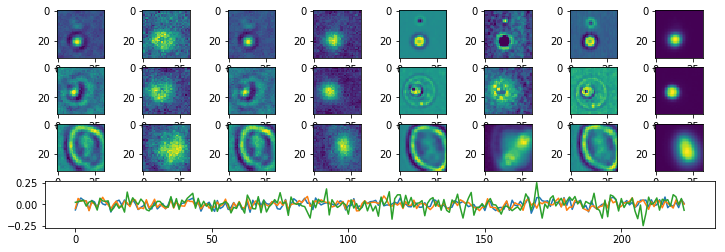

Epoch:  20 Iteration:  0 Loss:  5.10645 0.630839 0.00122494


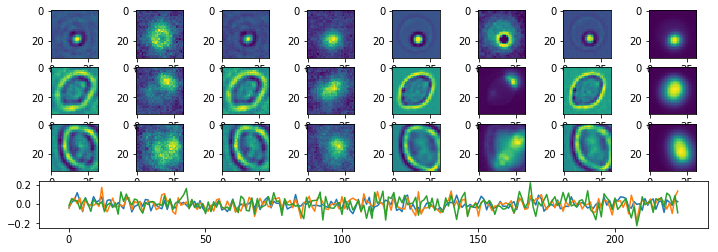

Epoch:  21 Iteration:  0 Loss:  4.97088 0.630768 0.00093475


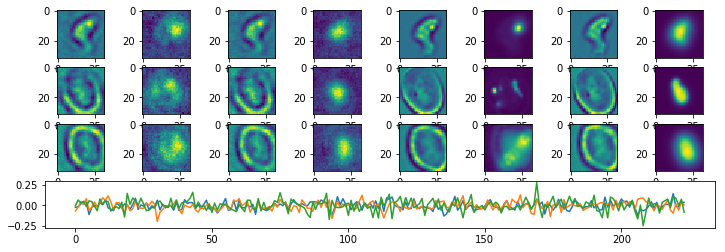

Epoch:  22 Iteration:  0 Loss:  4.78174 0.630668 0.000594169


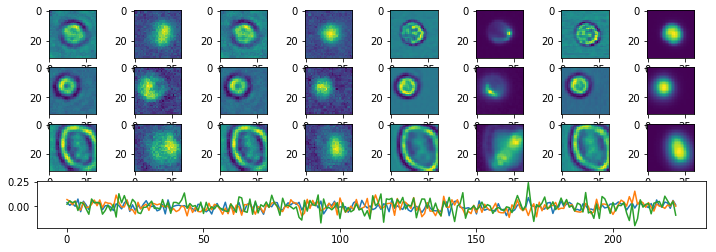

Epoch:  23 Iteration:  0 Loss:  4.68241 0.630615 0.000602841


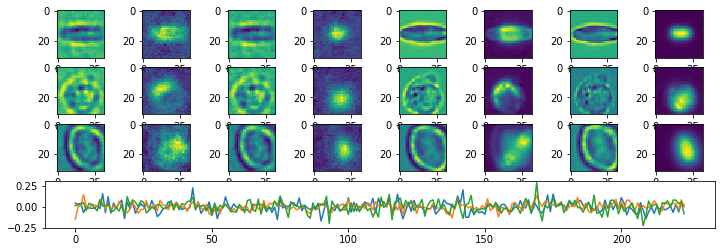

Epoch:  24 Iteration:  0 Loss:  4.5577 0.630548 0.00111583


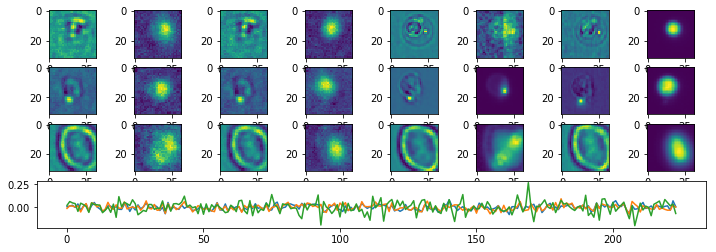

Epoch:  25 Iteration:  0 Loss:  4.47835 0.630506 0.000368893


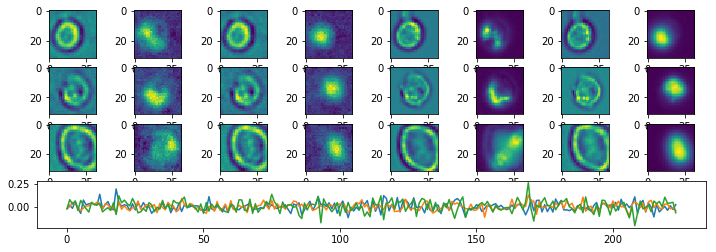

Epoch:  26 Iteration:  0 Loss:  4.39157 0.630461 0.000765771


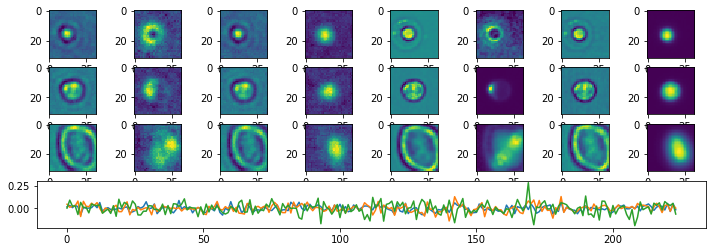

Epoch:  27 Iteration:  0 Loss:  4.33066 0.630427 0.00103262


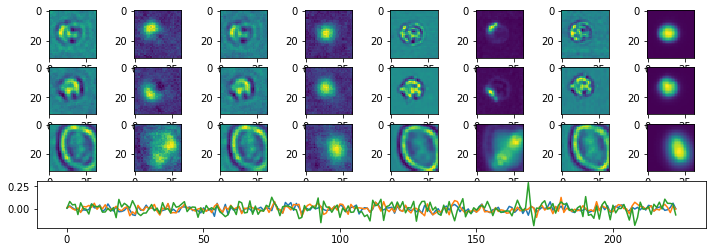

Epoch:  28 Iteration:  0 Loss:  4.2082 0.630363 0.000469744


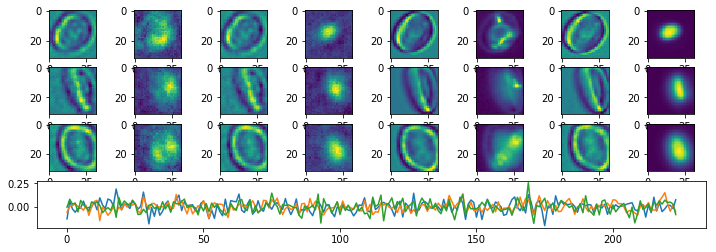

Epoch:  29 Iteration:  0 Loss:  4.15095 0.630334 0.000414133


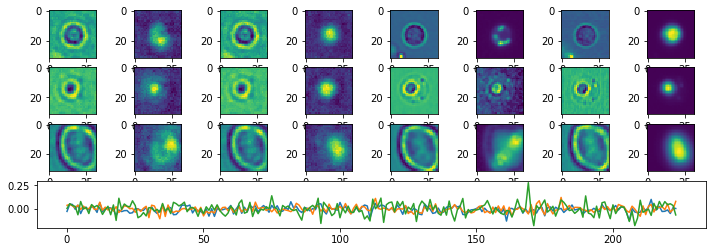

Epoch:  30 Iteration:  0 Loss:  4.08809 0.6303 0.000670582


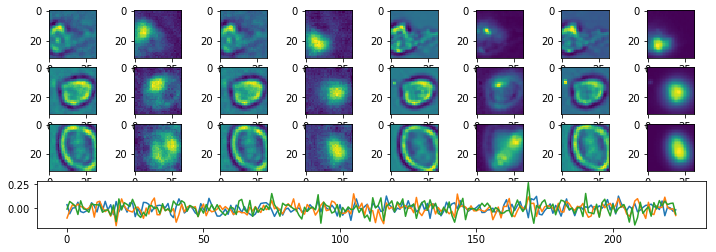

Epoch:  31 Iteration:  0 Loss:  4.01297 0.630262 0.000613928


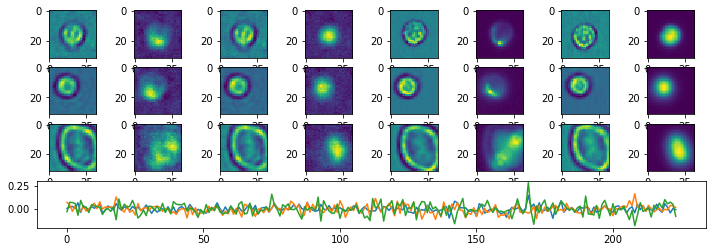

Epoch:  32 Iteration:  0 Loss:  3.96117 0.630233 0.000201166


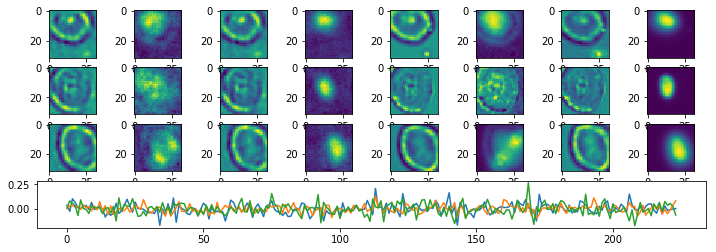

Epoch:  33 Iteration:  0 Loss:  3.91302 0.630208 0.00129727


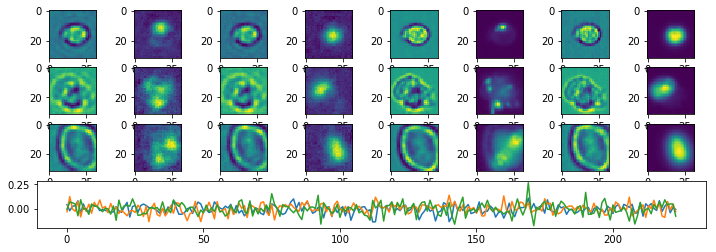

Epoch:  34 Iteration:  0 Loss:  3.82759 0.630165 0.000150979


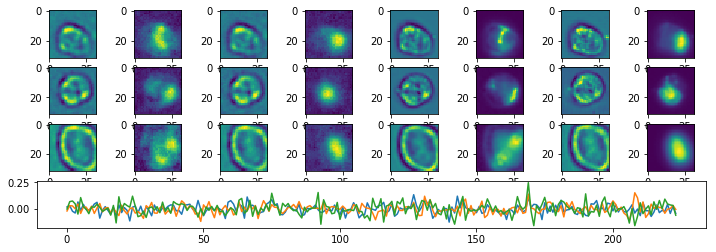

Epoch:  35 Iteration:  0 Loss:  3.8061 0.630152 0.000660926


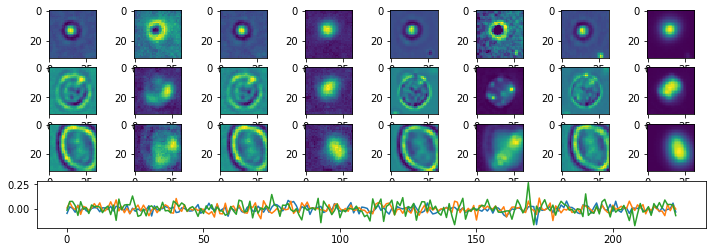

Epoch:  36 Iteration:  0 Loss:  3.73933 0.630117 0.000612438


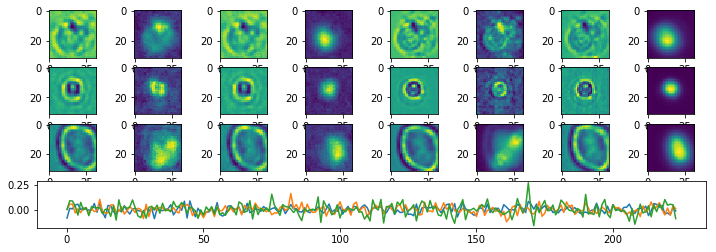

Epoch:  37 Iteration:  0 Loss:  3.65359 0.630076 0.000648081


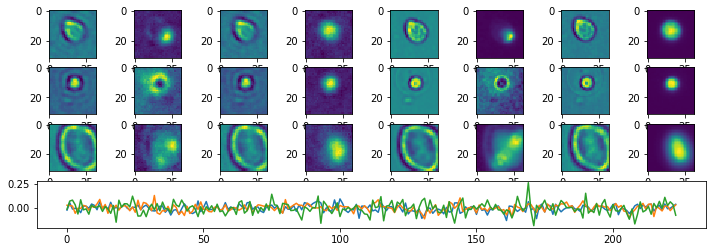

Epoch:  38 Iteration:  0 Loss:  3.66172 0.630077 0.000941187


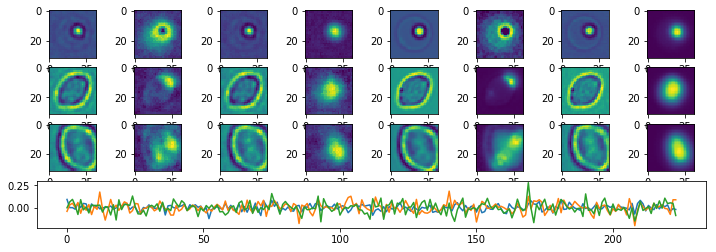

Epoch:  39 Iteration:  0 Loss:  3.55798 0.630022 0.000427455


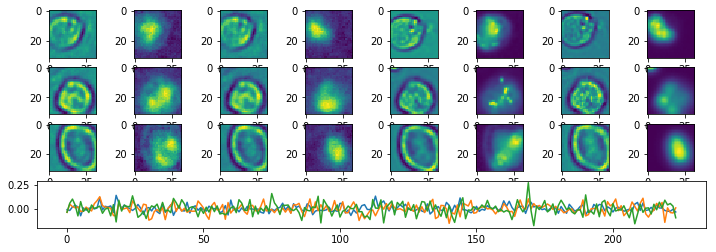

Epoch:  40 Iteration:  0 Loss:  3.5168 0.630001 0.000234842


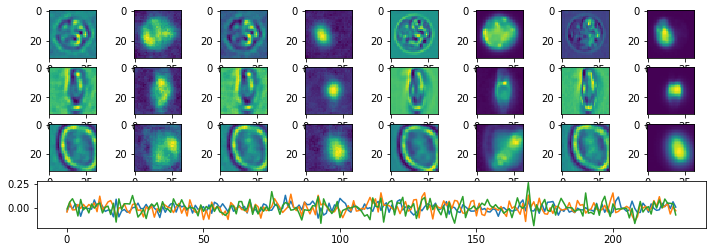

Epoch:  41 Iteration:  0 Loss:  3.48814 0.629986 0.000352263


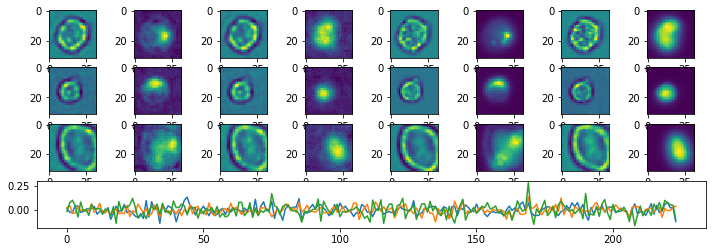

Epoch:  42 Iteration:  0 Loss:  3.45678 0.62997 0.000291228


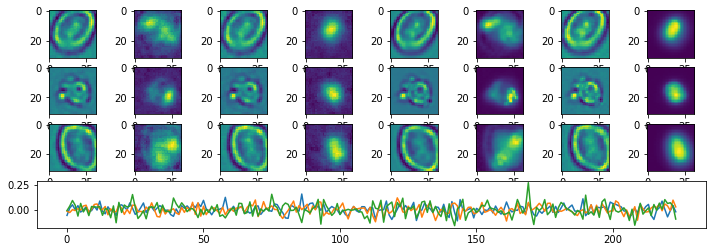

Epoch:  43 Iteration:  0 Loss:  3.40158 0.629942 0.00037232


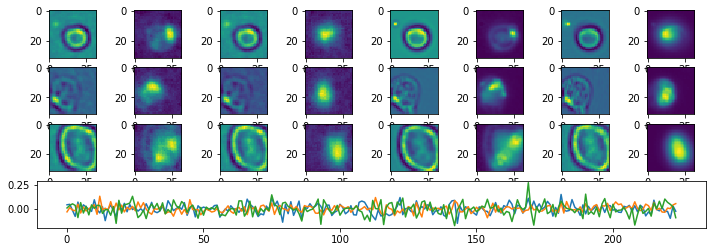

Epoch:  44 Iteration:  0 Loss:  3.36621 0.629924 0.00047946


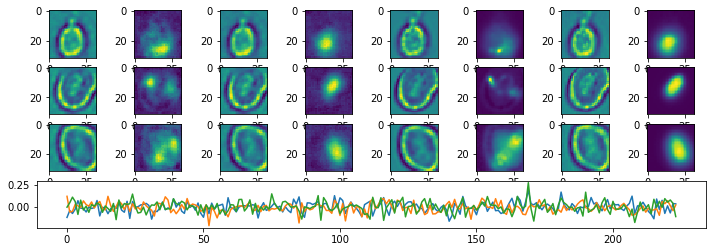

Epoch:  45 Iteration:  0 Loss:  3.30535 0.629892 0.000608563


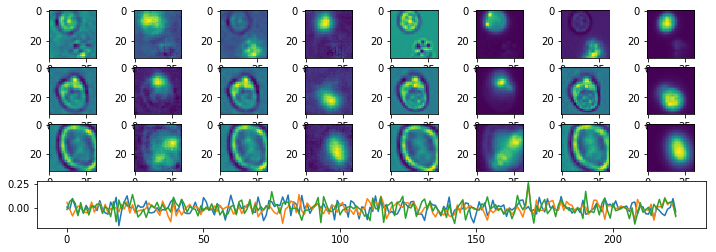

Epoch:  46 Iteration:  0 Loss:  3.35637 0.629918 0.000901699


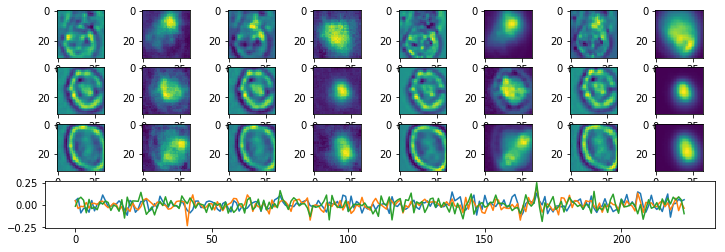

Epoch:  47 Iteration:  0 Loss:  3.2257 0.629851 0.000533015


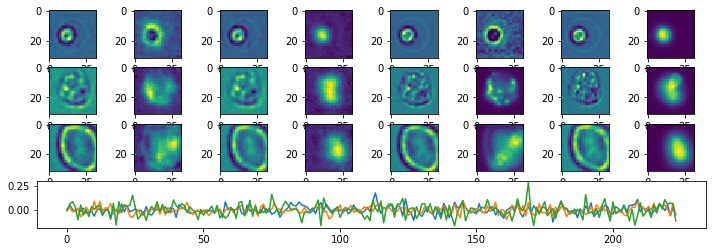

Epoch:  48 Iteration:  0 Loss:  3.19487 0.629835 0.000510156


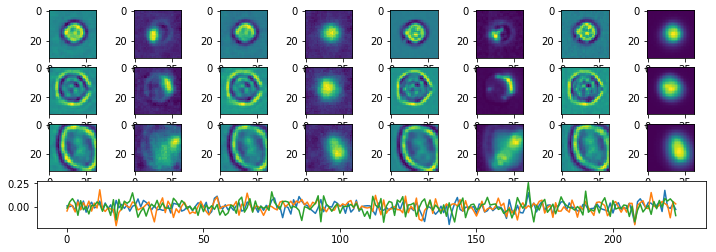

Epoch:  49 Iteration:  0 Loss:  3.17713 0.629825 0.000403106


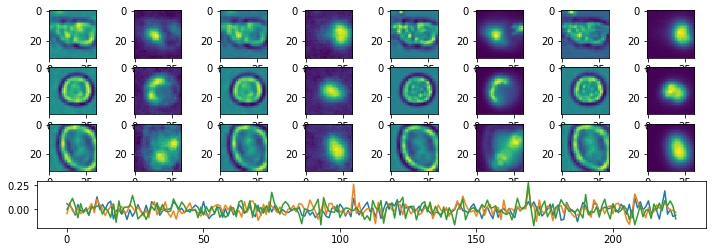

Epoch:  50 Iteration:  0 Loss:  3.15291 0.629813 0.000212371


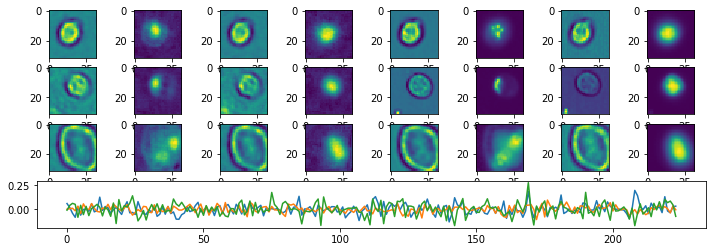

Epoch:  51 Iteration:  0 Loss:  3.11254 0.629792 0.000387847


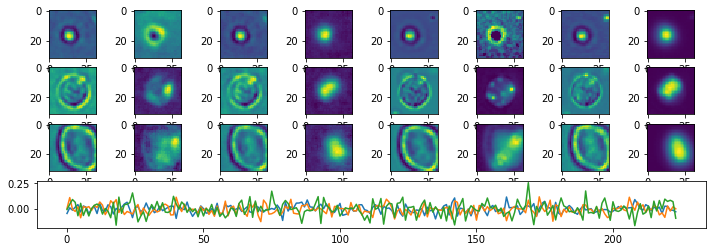

Epoch:  52 Iteration:  0 Loss:  3.08625 0.629779 0.000580132


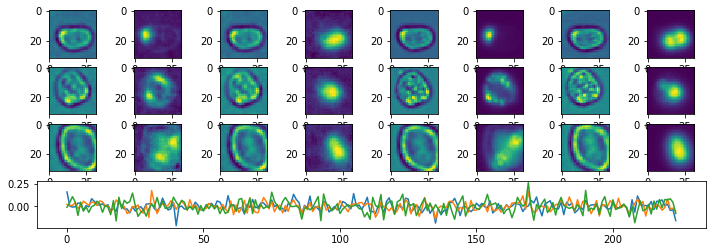

Epoch:  53 Iteration:  0 Loss:  3.10708 0.629791 0.000494957


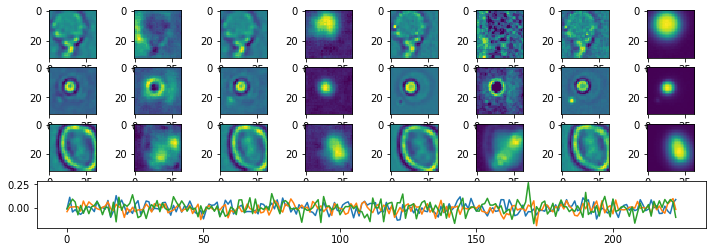

Epoch:  54 Iteration:  0 Loss:  3.01813 0.629744 0.000460029


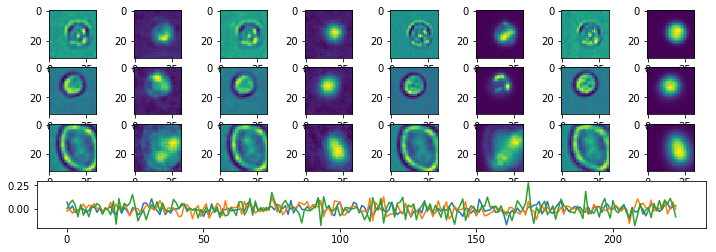

Epoch:  55 Iteration:  0 Loss:  3.01916 0.629745 0.000341058


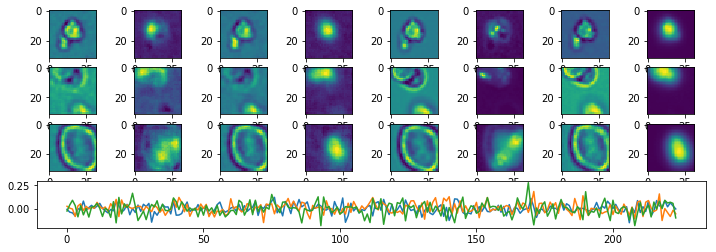

Epoch:  56 Iteration:  0 Loss:  3.00528 0.629738 0.000469863


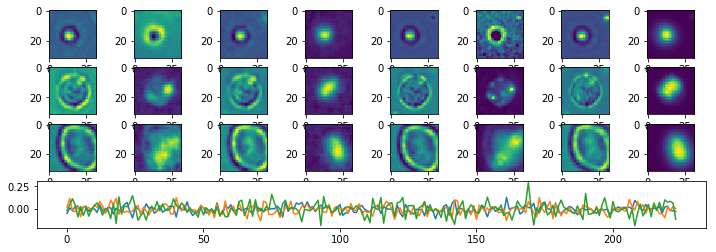

Epoch:  57 Iteration:  0 Loss:  2.95427 0.629713 0.000534415


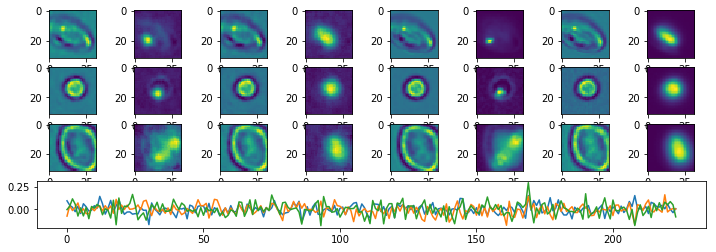

Epoch:  58 Iteration:  0 Loss:  2.9448 0.629706 0.000440955


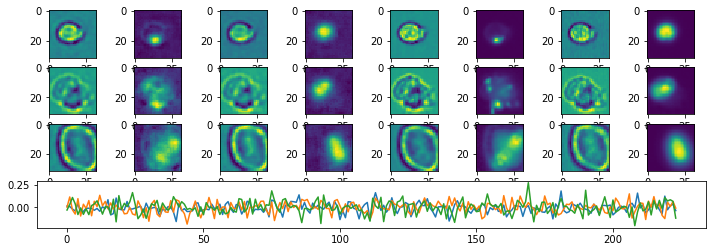

Epoch:  59 Iteration:  0 Loss:  2.91289 0.62969 0.000515252


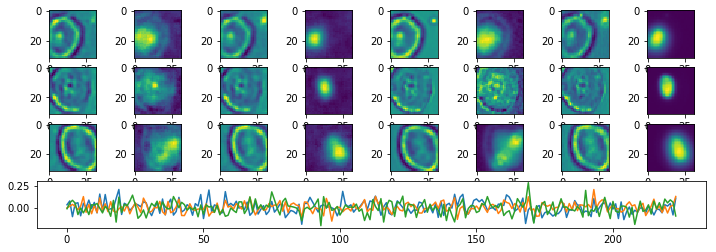

Epoch:  60 Iteration:  0 Loss:  2.88074 0.629674 0.000461042


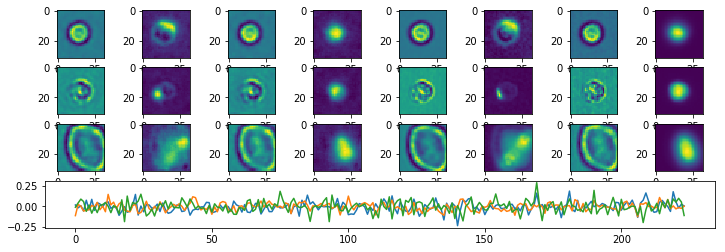

Epoch:  61 Iteration:  0 Loss:  2.88834 0.62968 0.000523239


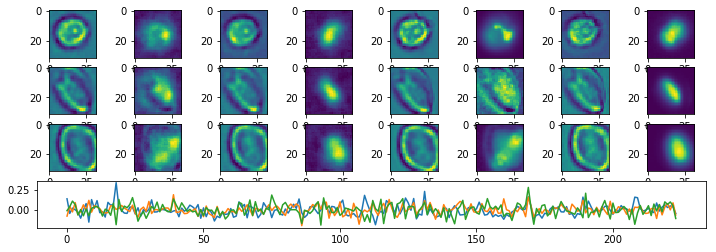

Epoch:  62 Iteration:  0 Loss:  2.84212 0.629654 6.23167e-05


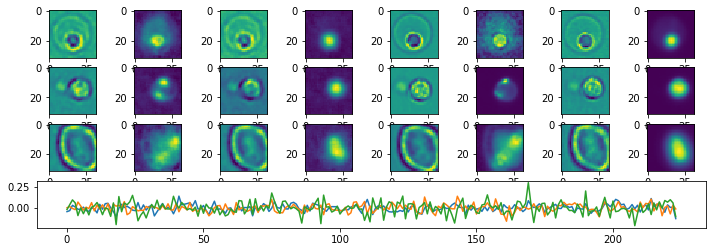

Epoch:  63 Iteration:  0 Loss:  2.81164 0.629637 0.000398576


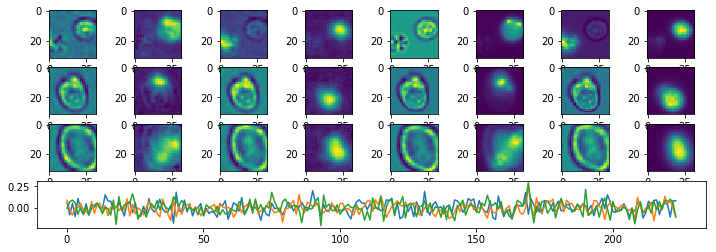

Epoch:  64 Iteration:  0 Loss:  2.82257 0.629644 0.000474781


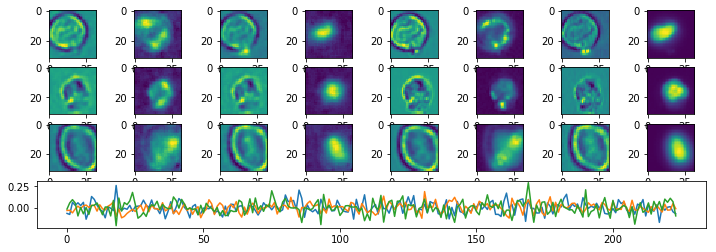

Epoch:  65 Iteration:  0 Loss:  2.77931 0.629624 0.000390738


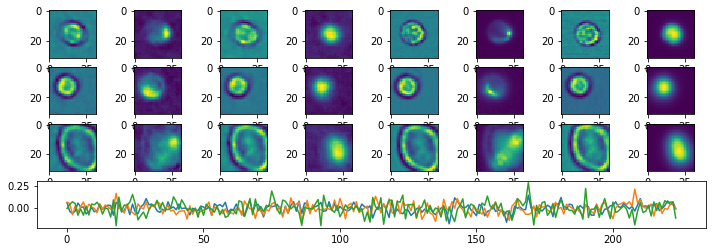

Epoch:  66 Iteration:  0 Loss:  2.75586 0.629609 0.000486881


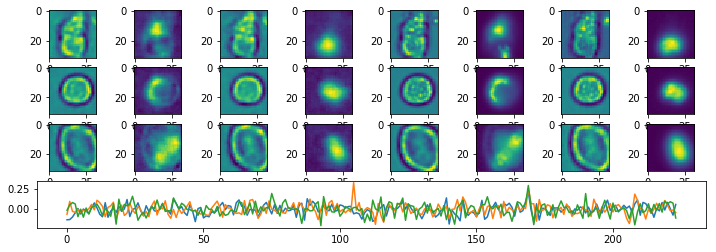

Epoch:  67 Iteration:  0 Loss:  2.7324 0.629597 0.000404626


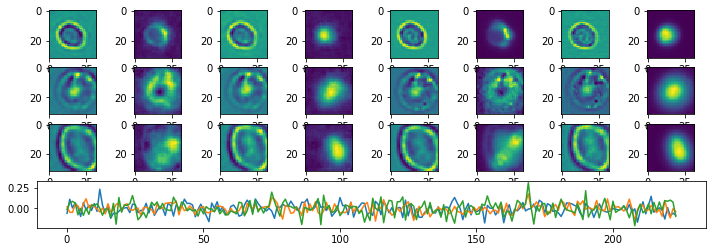

Epoch:  68 Iteration:  0 Loss:  2.75802 0.629612 0.00042522


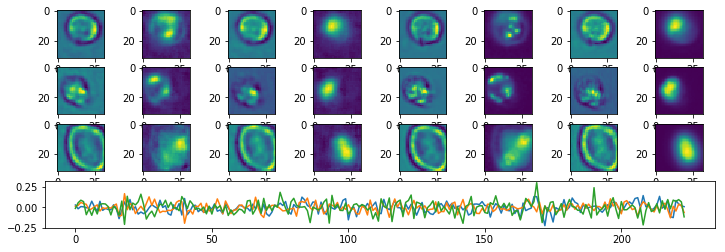

Epoch:  69 Iteration:  0 Loss:  2.71334 0.629588 0.00028941


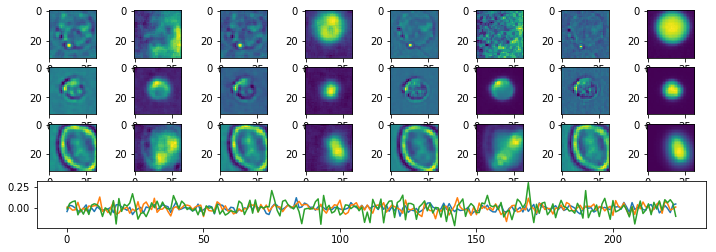

Epoch:  70 Iteration:  0 Loss:  2.69588 0.629581 0.000415057


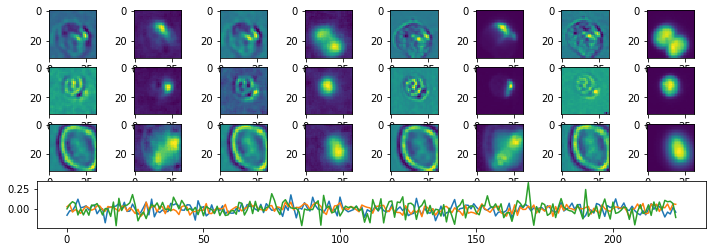

Epoch:  71 Iteration:  0 Loss:  2.69829 0.629582 6.7085e-05


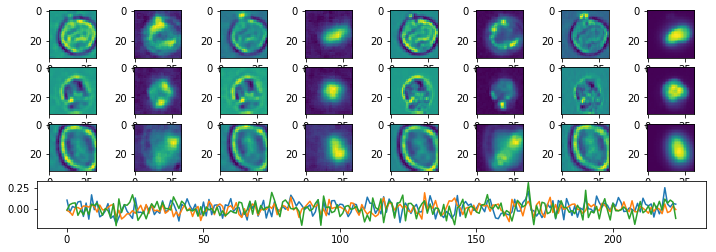

Epoch:  72 Iteration:  0 Loss:  2.65726 0.62956 0.000433505


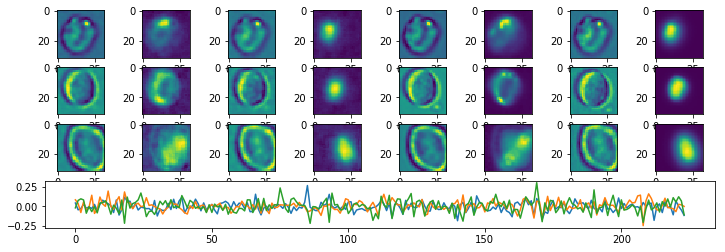

Epoch:  73 Iteration:  0 Loss:  2.62401 0.629544 0.00038746


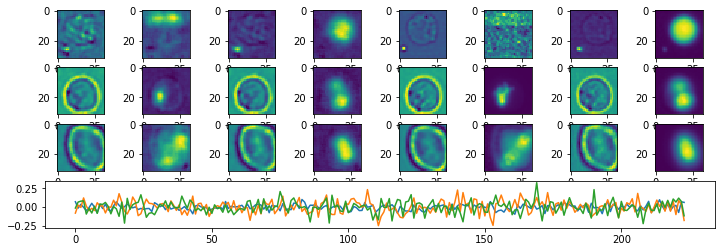

Epoch:  74 Iteration:  0 Loss:  2.61091 0.629535 0.000350296


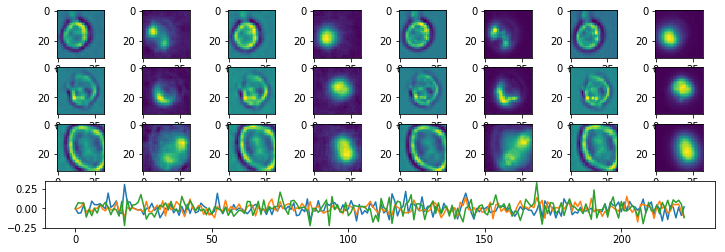

Epoch:  75 Iteration:  0 Loss:  5.91005 0.631241 0.00168023


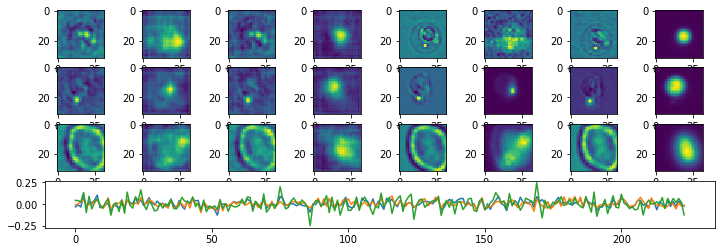

Epoch:  76 Iteration:  0 Loss:  3.35204 0.629919 0.000474125


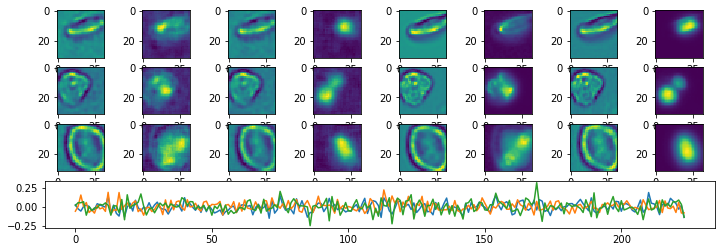

Epoch:  77 Iteration:  0 Loss:  3.04231 0.629758 0.000422359


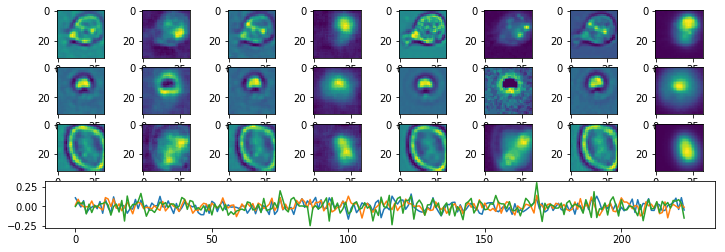

Epoch:  78 Iteration:  0 Loss:  2.93031 0.629706 0.000418961


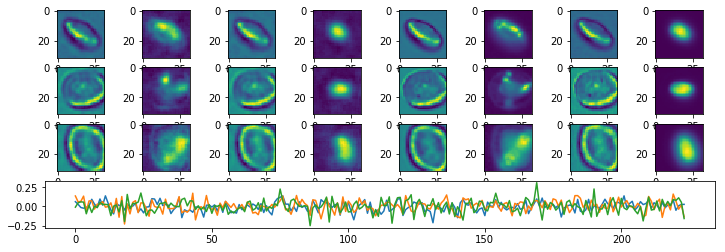

Epoch:  79 Iteration:  0 Loss:  2.85643 0.629662 0.000318527


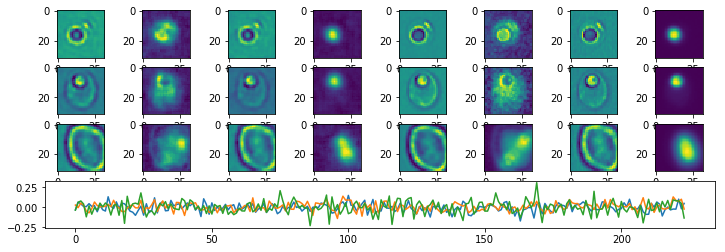

Epoch:  80 Iteration:  0 Loss:  2.81153 0.629641 0.00032717


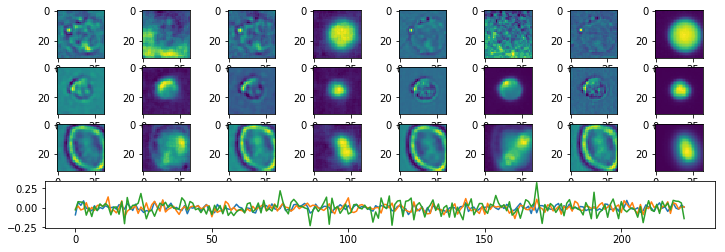

Epoch:  81 Iteration:  0 Loss:  2.77275 0.62962 0.000311643


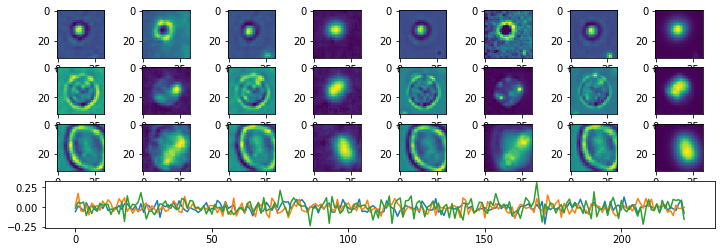

Epoch:  82 Iteration:  0 Loss:  2.73527 0.6296 0.000265956


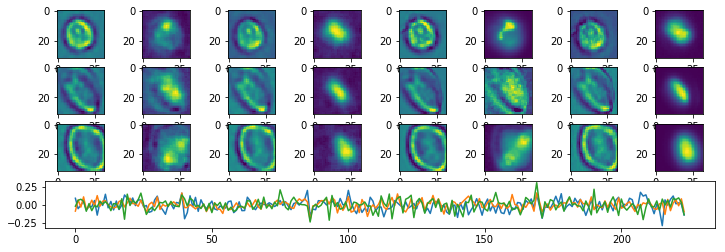

Epoch:  83 Iteration:  0 Loss:  2.75383 0.629609 0.00039646


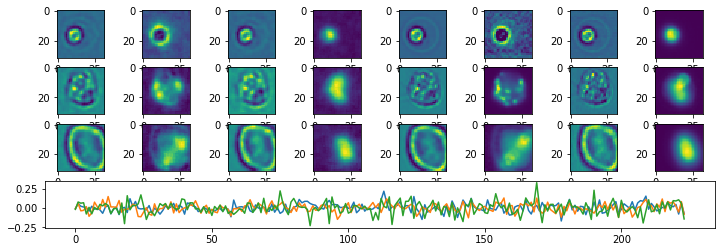

Epoch:  84 Iteration:  0 Loss:  2.72996 0.629596 0.000415564


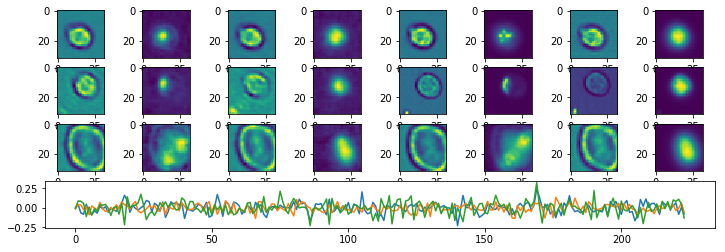

Epoch:  85 Iteration:  0 Loss:  2.6815 0.629571 0.000299245


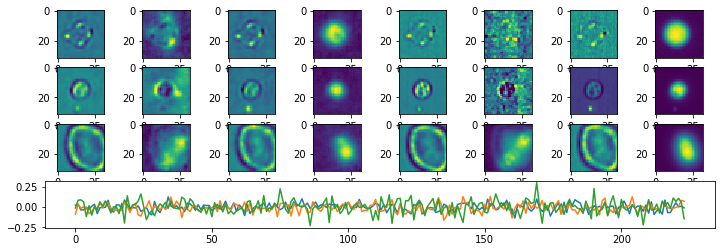

Epoch:  86 Iteration:  0 Loss:  2.67226 0.629567 0.000348926


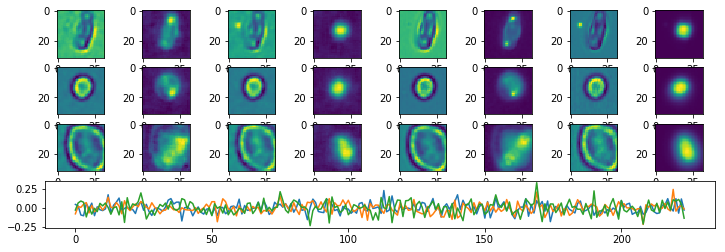

Epoch:  87 Iteration:  0 Loss:  2.66881 0.629566 0.000343084


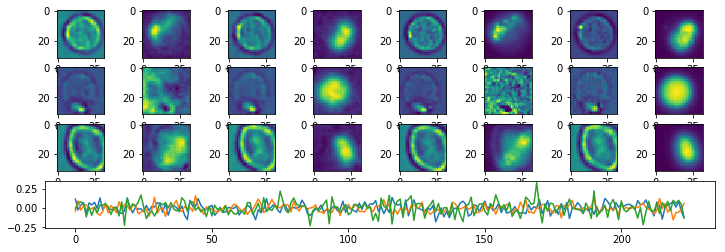

Epoch:  88 Iteration:  0 Loss:  2.67461 0.629567 0.000339061


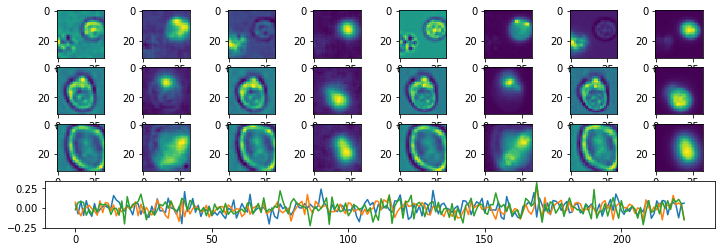

Epoch:  89 Iteration:  0 Loss:  2.65503 0.629558 0.000306219


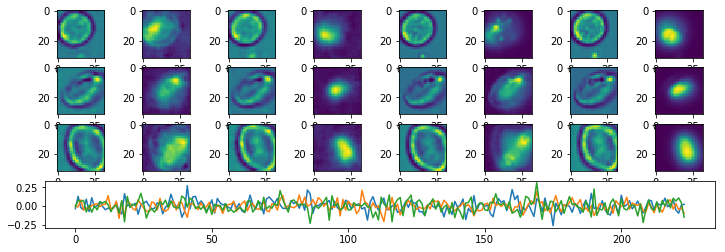

Epoch:  90 Iteration:  0 Loss:  2.65584 0.629558 0.000344545


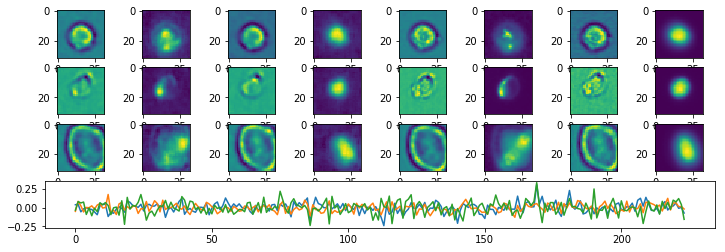

Epoch:  91 Iteration:  0 Loss:  2.62528 0.629542 0.000342846


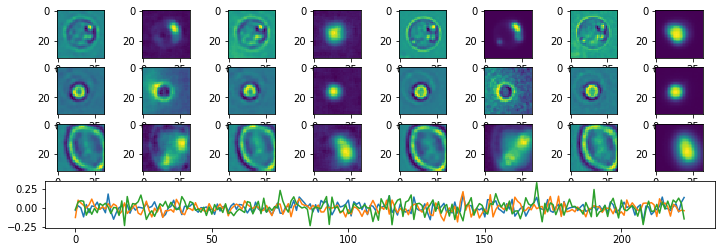

Epoch:  92 Iteration:  0 Loss:  2.63065 0.629545 0.000441581


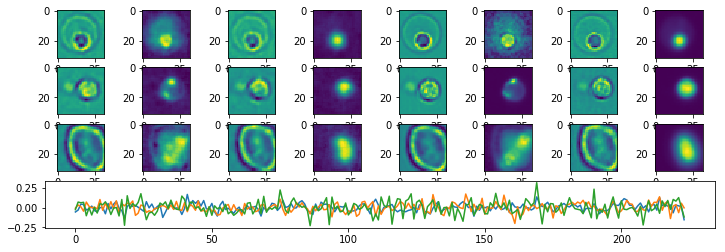

Epoch:  93 Iteration:  0 Loss:  2.61872 0.629539 0.000394166


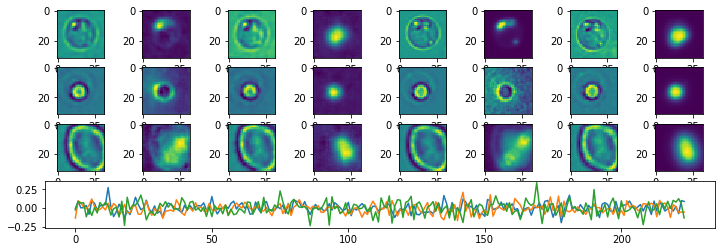

Epoch:  94 Iteration:  0 Loss:  2.618 0.629539 0.0003618


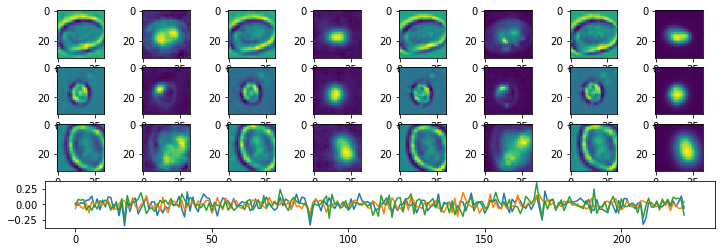

Epoch:  95 Iteration:  0 Loss:  2.60568 0.629532 0.000444263


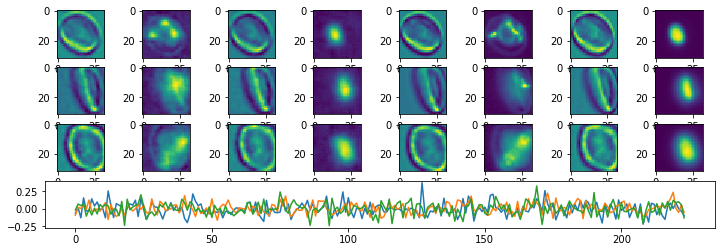

Epoch:  96 Iteration:  0 Loss:  2.58509 0.629522 0.000272274


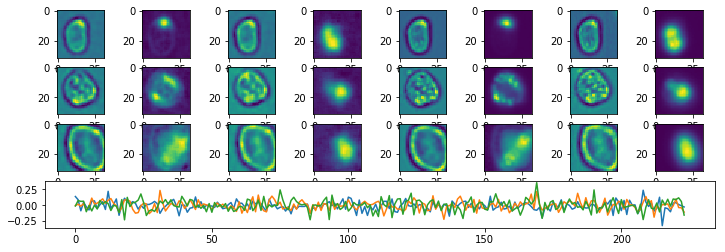

Epoch:  97 Iteration:  0 Loss:  2.57235 0.629515 0.00033322


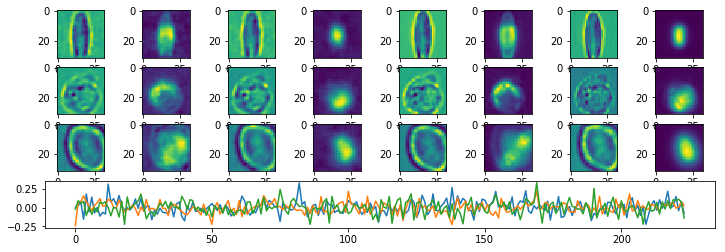

Epoch:  98 Iteration:  0 Loss:  2.59204 0.629525 0.000407547


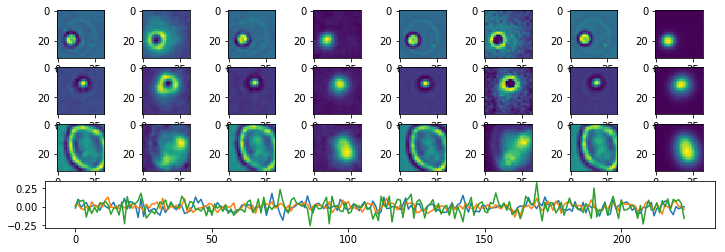

Epoch:  99 Iteration:  0 Loss:  2.56533 0.629512 0.000294477


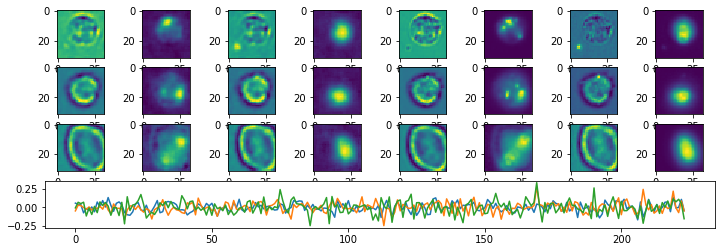

Epoch:  100 Iteration:  0 Loss:  2.57367 0.629515 0.000459194


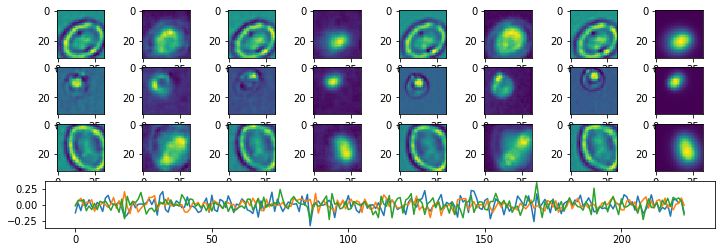

Epoch:  101 Iteration:  0 Loss:  2.55734 0.629507 0.000434548


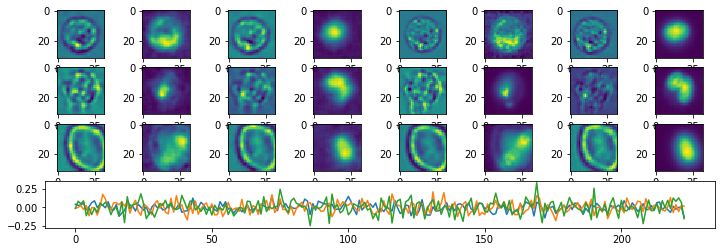

Epoch:  102 Iteration:  0 Loss:  2.54074 0.629499 0.000379503


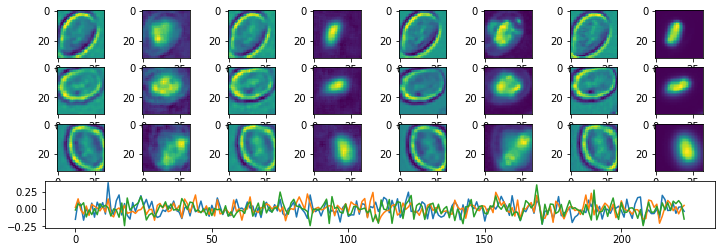

Epoch:  103 Iteration:  0 Loss:  2.55002 0.629505 0.000394642


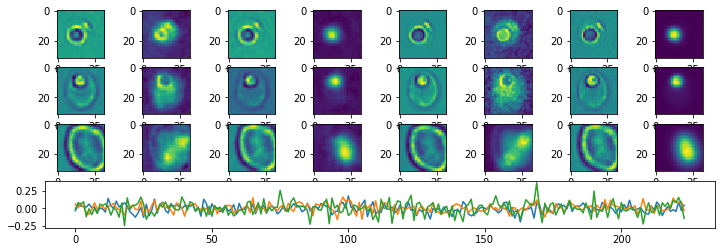

Epoch:  104 Iteration:  0 Loss:  2.53311 0.629494 0.000351518


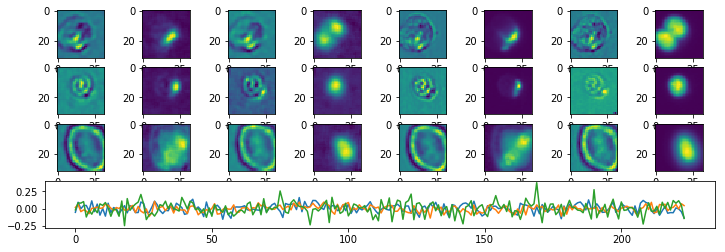

Epoch:  105 Iteration:  0 Loss:  2.52347 0.629489 0.000302702


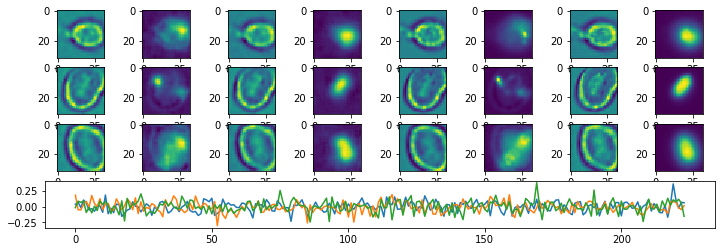

Epoch:  106 Iteration:  0 Loss:  2.51027 0.629482 0.00033471


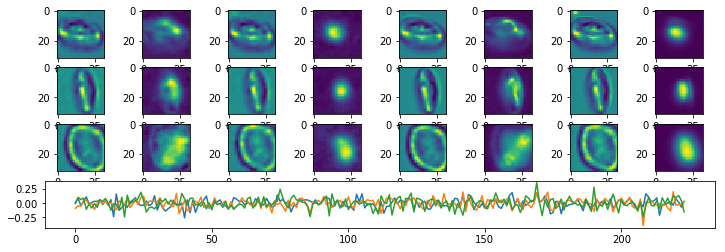

Epoch:  107 Iteration:  0 Loss:  2.51906 0.629488 0.000243843


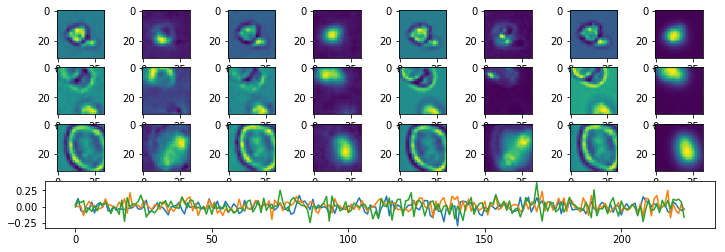

Epoch:  108 Iteration:  0 Loss:  2.49949 0.629478 9.49502e-05


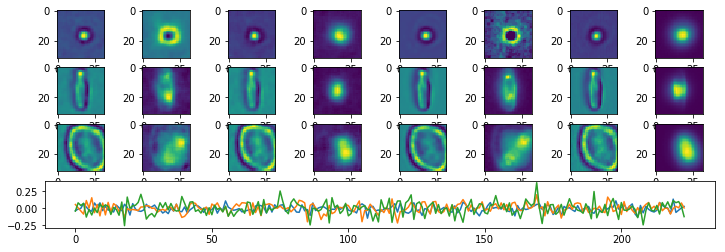

Epoch:  109 Iteration:  0 Loss:  2.51743 0.629487 0.000468791


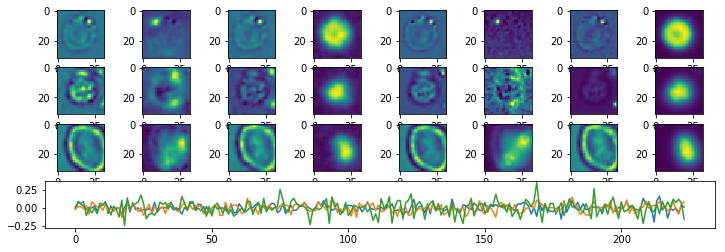

Epoch:  110 Iteration:  0 Loss:  2.49309 0.629476 0.000384629


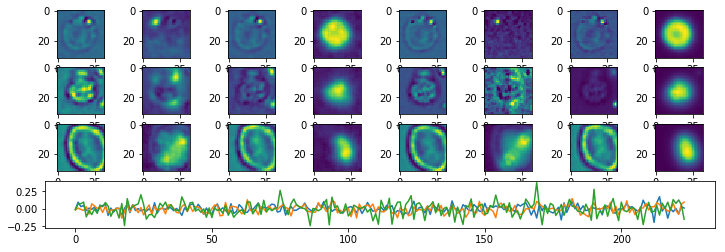

Epoch:  111 Iteration:  0 Loss:  2.48334 0.629469 0.000324339


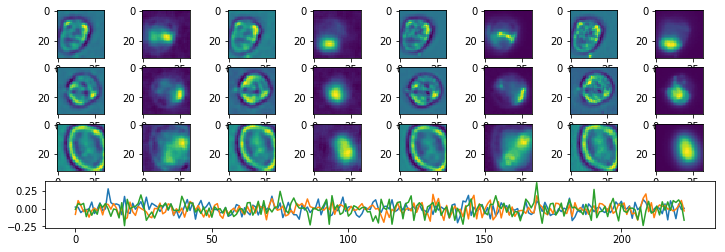

Epoch:  112 Iteration:  0 Loss:  2.48483 0.62947 0.000478268


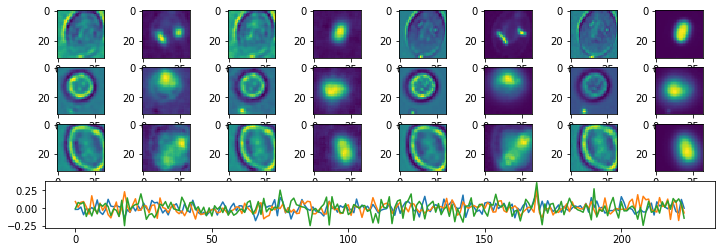

Epoch:  113 Iteration:  0 Loss:  2.48701 0.62947 0.000616252


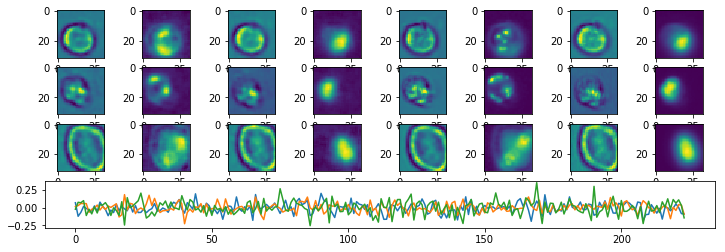

Epoch:  114 Iteration:  0 Loss:  2.4606 0.629458 9.83477e-07


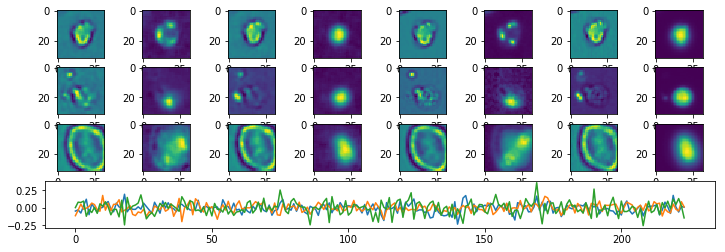

Epoch:  115 Iteration:  0 Loss:  2.4778 0.629467 0.000316143


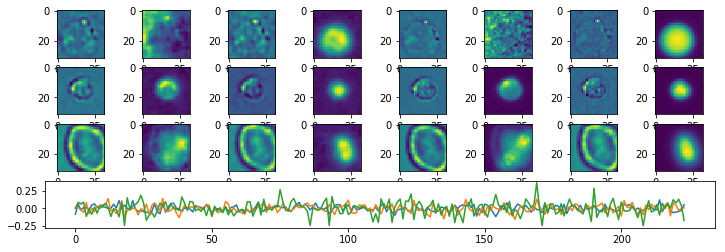

Epoch:  116 Iteration:  0 Loss:  2.44139 0.629447 0.000433117


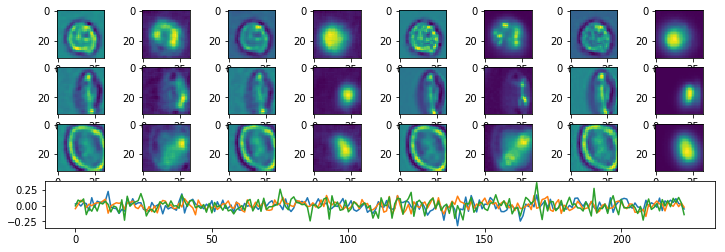

Epoch:  117 Iteration:  0 Loss:  2.45329 0.629454 0.000485897


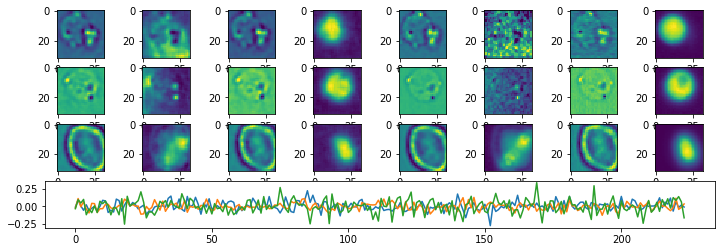

Epoch:  118 Iteration:  0 Loss:  3.79166 0.630158 0.000463873


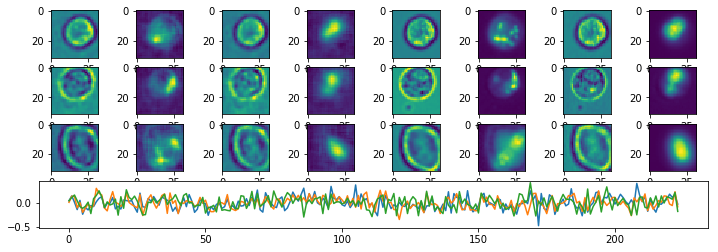

Epoch:  119 Iteration:  0 Loss:  3.29145 0.629906 0.000380933


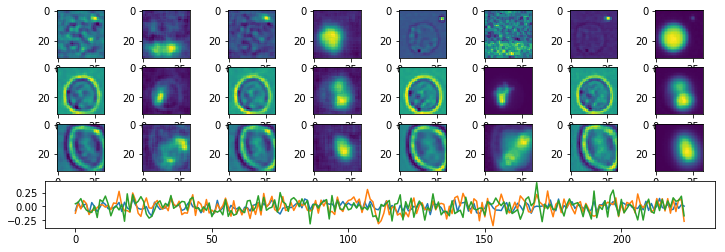

Done


In [5]:

p_mmdict = mmdict #{"Fish6_15_cjw_64.tif.mm": m3}
#             "plate04_all.mm": m4}

p_width = 32
p_height = 32
p_nchannels = 4
p_channels = [0,1,3,4]
p_nepochs = 120
p_batchsize = 128
p_learning_rate = 0.0001  #.00005
p_restore = False
p_latent_size = 224 #128 + 64
p_droprate = 0.95
p_stdev = .04

enc_sizes = [(128, 3), (256, 3), (512, 3)]  #128, 3)]
######enc_sizes = [(64, 3), (128, 3), (256,3), (512,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
#enc_sizes = [(16, 5), (32, 3), (64,3), (128,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
dec_sizes = list(reversed(enc_sizes))
#dec_sizes.append((p_nchannels,7))

params = dict()

params['width'] = p_width
params['height'] = p_height
params['nchannels'] = p_nchannels
params['channels'] = p_channels
params['nepochs'] = p_nepochs
params['batchsize'] = p_batchsize
params['learning_rate'] = p_learning_rate
params['restore'] = p_restore
params['latent_size'] = p_latent_size
params['droprate'] = p_droprate
params['stdev'] = p_stdev

params['enc_sizes'] = enc_sizes
params['dec_sizes'] = dec_sizes

cpdir = "/media/cjw/Data/cyto/Checkpoints/2018-04-25-LS224"

if not os.path.exists(cpdir):
    os.makedirs(cpdir)
autoencoder_train.train(p_mmdict, p_df, params, 500, cpdir)

In [7]:
x = 4
x

4